# Train stronger corridor segmentation model — no intent — pbar version

Модель без `intent`: RGB image → corridor mask.

Изменения v2:
- один `tqdm` progress bar на эпоху: train + val в одном синем bar;
- batch-логи пишутся в `train.log`, но не спамят notebook output;
- ResNet50 encoder + U-Net-style decoder;
- аугментации записаны в `config.json`;
- train/val loss, Dice, IoU сохраняются после каждой эпохи в `history.json` и `history.csv`.


In [13]:
from pathlib import Path
import os
import json
import random
import time
import math
import logging
import shutil
from datetime import datetime
from collections import defaultdict

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.cuda import amp

from PIL import Image, ImageDraw, ImageFont, ImageEnhance, ImageFilter
from IPython.display import display
from tqdm.auto import tqdm

# -------------------------
# Paths
# -------------------------
PROJECT_ROOT = Path("/home/Jupyter/datasets/tesla/Waymo_open_dataset")
DATASET_ROOT = PROJECT_ROOT / "prepared_camera_corridor_dataset_filtered_front_v1"
CAMERA_NAME = "FRONT"

TRAIN_MANIFEST = DATASET_ROOT / "train" / CAMERA_NAME / "manifest.jsonl"
VAL_MANIFEST = DATASET_ROOT / "val" / CAMERA_NAME / "manifest.jsonl"

RUN_DIR = PROJECT_ROOT / "runs" / "corridor_resnet50_augmented_no_intent_v2"
RUN_DIR.mkdir(parents=True, exist_ok=True)

# -------------------------
# Training config
# -------------------------
SEED = 42
IMAGE_SIZE = (384, 640)  # h, w
BATCH_SIZE = 32
NUM_EPOCHS = 20
LR = 2e-4
WEIGHT_DECAY = 1e-4
NUM_WORKERS = 12
PIN_MEMORY = False
PRETRAINED_ENCODER = True

# CPU/GPU
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
USE_AMP = (DEVICE == "cuda")

# Loss
BCE_WEIGHT = 1.0
DICE_WEIGHT = 1.0

# Metrics / visualization
MAIN_THRESHOLD = 0.50
VIS_THRESHOLDS = [0.30, 0.50, 0.70]
NUM_VIS_EXAMPLES = 40
LOG_EVERY_N_BATCHES = 50

# Optional smoke/debug limits. None = full data.
MAX_TRAIN_SAMPLES = None
MAX_VAL_SAMPLES = None

# Torch threads for CPU mode. Increase if you want.
if DEVICE == "cpu":
    torch.set_num_threads(8)
    torch.set_num_interop_threads(1)

# Pillow compatibility
try:
    PIL_BILINEAR = Image.Resampling.BILINEAR
    PIL_NEAREST = Image.Resampling.NEAREST
except AttributeError:
    PIL_BILINEAR = Image.BILINEAR
    PIL_NEAREST = Image.NEAREST

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

def seed_worker(worker_id):
    worker_seed = SEED + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)

print("DEVICE:", DEVICE)
print("TRAIN_MANIFEST:", TRAIN_MANIFEST, TRAIN_MANIFEST.exists())
print("VAL_MANIFEST:", VAL_MANIFEST, VAL_MANIFEST.exists())
print("RUN_DIR:", RUN_DIR)


DEVICE: cuda
TRAIN_MANIFEST: /home/Jupyter/datasets/tesla/Waymo_open_dataset/prepared_camera_corridor_dataset_filtered_front_v1/train/FRONT/manifest.jsonl True
VAL_MANIFEST: /home/Jupyter/datasets/tesla/Waymo_open_dataset/prepared_camera_corridor_dataset_filtered_front_v1/val/FRONT/manifest.jsonl True
RUN_DIR: /home/Jupyter/datasets/tesla/Waymo_open_dataset/runs/corridor_resnet50_augmented_no_intent_v2


In [14]:
# -------------------------
# Logging
# -------------------------
LOG_PATH = RUN_DIR / "train.log"
STATUS_PATH = RUN_DIR / "status.json"
HISTORY_PATH = RUN_DIR / "history.json"
HISTORY_CSV_PATH = RUN_DIR / "history.csv"
CONFIG_PATH = RUN_DIR / "config.json"

# Keep notebook output clean: batch progress is shown by tqdm, detailed logs go to file.
LOG_TO_NOTEBOOK = False

logger = logging.getLogger("corridor_resnet50_no_intent_v2")
logger.setLevel(logging.INFO)
logger.handlers.clear()
logger.propagate = False

fmt = logging.Formatter("%(asctime)s | %(levelname)s | %(message)s", datefmt="%Y-%m-%d %H:%M:%S")

fh = logging.FileHandler(LOG_PATH, mode="a", encoding="utf-8")
fh.setFormatter(fmt)
logger.addHandler(fh)

if LOG_TO_NOTEBOOK:
    sh = logging.StreamHandler()
    sh.setFormatter(fmt)
    logger.addHandler(sh)

def log(msg):
    logger.info(msg)

def write_json(path, obj):
    path.write_text(json.dumps(obj, indent=2, ensure_ascii=False), encoding="utf-8")

def write_status(**kwargs):
    payload = {
        "updated_at": datetime.now().isoformat(timespec="seconds"),
        **kwargs,
    }
    write_json(STATUS_PATH, payload)

log("Notebook started")
print(f"Logging to: {LOG_PATH}")


Logging to: /home/Jupyter/datasets/tesla/Waymo_open_dataset/runs/corridor_resnet50_augmented_no_intent_v2/train.log


In [15]:
# -------------------------
# Manifest loading
# -------------------------
def read_manifest_jsonl_safe(path: Path):
    rows = []
    bad_lines = 0
    with path.open("r", encoding="utf-8") as f:
        for line_idx, line in enumerate(f, start=1):
            line = line.strip()
            if not line:
                continue
            try:
                rows.append(json.loads(line))
            except json.JSONDecodeError:
                # Safe for manifests that are still being written.
                bad_lines += 1
                continue
    return rows, bad_lines

train_rows, train_bad = read_manifest_jsonl_safe(TRAIN_MANIFEST)
val_rows, val_bad = read_manifest_jsonl_safe(VAL_MANIFEST)

if MAX_TRAIN_SAMPLES is not None:
    train_rows = train_rows[:MAX_TRAIN_SAMPLES]
if MAX_VAL_SAMPLES is not None:
    val_rows = val_rows[:MAX_VAL_SAMPLES]

print("train rows:", len(train_rows), "bad lines:", train_bad)
print("val rows  :", len(val_rows), "bad lines:", val_bad)
print("example train row keys:", list(train_rows[0].keys()) if train_rows else None)
print("example val row keys  :", list(val_rows[0].keys()) if val_rows else None)

assert len(train_rows) > 0, "No train rows loaded"
assert len(val_rows) > 0, "No val rows loaded"


train rows: 296305 bad lines: 0
val rows  : 73429 bad lines: 0
example train row keys: ['split', 'sample_id', 'camera_name', 'sample_dir', 'tfrecord_path', 'image_path', 'corridor_mask_path', 'centerline_mask_path', 'gaussian_heatmap_path', 'projected_uv_gt_path', 'gt_num_points', 'visible_uv_points', 'visible_path_length_px', 'corridor_pixels', 'corridor_width_px', 'centerline_width_px', 'gaussian_sigma_px', 'min_visible_points', 'min_visible_path_length_px', 'min_corridor_pixels', 'image_height', 'image_width']
example val row keys  : ['split', 'sample_id', 'camera_name', 'sample_dir', 'tfrecord_path', 'image_path', 'corridor_mask_path', 'centerline_mask_path', 'gaussian_heatmap_path', 'projected_uv_gt_path', 'gt_num_points', 'visible_uv_points', 'visible_path_length_px', 'corridor_pixels', 'corridor_width_px', 'centerline_width_px', 'gaussian_sigma_px', 'min_visible_points', 'min_visible_path_length_px', 'min_corridor_pixels', 'image_height', 'image_width']


In [16]:
# -------------------------
# Path resolver and dataset
# -------------------------
def resolve_path(p):
    p = Path(p)
    if p.is_absolute():
        return p

    candidates = [
        PROJECT_ROOT / p,
        DATASET_ROOT / p,
        DATASET_ROOT / "train" / CAMERA_NAME / p,
        DATASET_ROOT / "val" / CAMERA_NAME / p,
    ]
    for c in candidates:
        if c.exists():
            return c
    return PROJECT_ROOT / p

IMAGE_KEYS = ["image_path", "rgb_path", "camera_image_path", "image", "img_path"]
MASK_KEYS = ["mask_path", "corridor_mask_path", "target_path", "label_path", "mask"]

def get_image_mask_paths(row):
    img_path = None
    mask_path = None

    for k in IMAGE_KEYS:
        if k in row and row[k]:
            img_path = resolve_path(row[k])
            break
    for k in MASK_KEYS:
        if k in row and row[k]:
            mask_path = resolve_path(row[k])
            break

    if img_path is None or mask_path is None:
        raise KeyError(f"Cannot find image/mask paths in row keys: {list(row.keys())}")
    return img_path, mask_path

# quick path test
_img, _mask = get_image_mask_paths(train_rows[0])
print("sample image:", _img, _img.exists())
print("sample mask :", _mask, _mask.exists())
assert _img.exists(), _img
assert _mask.exists(), _mask


sample image: /home/Jupyter/datasets/tesla/Waymo_open_dataset/prepared_camera_corridor_dataset_filtered_front_v1/train/FRONT/0/image.png True
sample mask : /home/Jupyter/datasets/tesla/Waymo_open_dataset/prepared_camera_corridor_dataset_filtered_front_v1/train/FRONT/0/corridor_mask.png True


## Augmentations

Аугментации здесь специально направлены на переносимость на другие камеры:

- `ColorJitter`-подобные изменения: яркость/контраст/цвет — разные камеры и освещение.
- Blur/noise/JPEG-like degradation — сжатие, motion blur, интернет-фото.
- Random resized crop / scale — другой фокус и поле зрения.
- Small perspective/affine shift — другой угол камеры.
- Bottom occlusion — имитация торпеды/капота/обрезанного нижнего края.
- Horizontal flip отключен по умолчанию, потому что для дороги он не всегда физически корректен, но можно включить.


In [17]:
# -------------------------
# Augmentations using PIL + numpy only
# -------------------------
class RoadAugmenter:
    def __init__(self,
                 p_color=0.80,
                 p_blur=0.15,
                 p_noise=0.25,
                 p_crop=0.45,
                 p_perspective=0.20,
                 p_bottom_occlusion=0.35,
                 p_flip=0.00):
        self.p_color = p_color
        self.p_blur = p_blur
        self.p_noise = p_noise
        self.p_crop = p_crop
        self.p_perspective = p_perspective
        self.p_bottom_occlusion = p_bottom_occlusion
        self.p_flip = p_flip

    def _color_jitter(self, img):
        # brightness, contrast, saturation
        if random.random() < 0.8:
            img = ImageEnhance.Brightness(img).enhance(random.uniform(0.65, 1.35))
        if random.random() < 0.8:
            img = ImageEnhance.Contrast(img).enhance(random.uniform(0.70, 1.35))
        if random.random() < 0.7:
            img = ImageEnhance.Color(img).enhance(random.uniform(0.65, 1.35))
        return img

    def _random_resized_crop(self, img, mask):
        w, h = img.size
        scale = random.uniform(0.78, 1.00)
        crop_w = int(w * scale)
        crop_h = int(h * scale)
        if crop_w >= w or crop_h >= h:
            return img, mask
        x0 = random.randint(0, w - crop_w)
        # Prefer crops that keep bottom road, but allow some vertical variation.
        max_y0 = h - crop_h
        y0 = random.randint(0, max_y0)
        img = img.crop((x0, y0, x0 + crop_w, y0 + crop_h)).resize((w, h), PIL_BILINEAR)
        mask = mask.crop((x0, y0, x0 + crop_w, y0 + crop_h)).resize((w, h), PIL_NEAREST)
        return img, mask

    def _affine_translate_scale(self, img, mask):
        w, h = img.size
        max_dx = int(0.04 * w)
        max_dy = int(0.04 * h)
        dx = random.randint(-max_dx, max_dx)
        dy = random.randint(-max_dy, max_dy)
        scale = random.uniform(0.94, 1.06)

        nw, nh = int(w * scale), int(h * scale)
        img2 = img.resize((nw, nh), PIL_BILINEAR)
        mask2 = mask.resize((nw, nh), PIL_NEAREST)

        canvas_img = Image.new("RGB", (w, h), (0, 0, 0))
        canvas_mask = Image.new("L", (w, h), 0)
        x = (w - nw) // 2 + dx
        y = (h - nh) // 2 + dy
        canvas_img.paste(img2, (x, y))
        canvas_mask.paste(mask2, (x, y))
        return canvas_img, canvas_mask

    def _bottom_occlusion(self, img, mask):
        # Simulate dashboard/hood/different crop. Mask is also occluded: those pixels should not be corridor.
        w, h = img.size
        occ_h = random.randint(int(0.03 * h), int(0.16 * h))
        y0 = h - occ_h
        img_np = np.asarray(img).copy()
        color = np.array([random.randint(5, 45), random.randint(5, 45), random.randint(5, 45)], dtype=np.uint8)
        img_np[y0:h, :, :] = color
        mask_np = np.asarray(mask).copy()
        mask_np[y0:h, :] = 0
        return Image.fromarray(img_np), Image.fromarray(mask_np)

    def _noise(self, img):
        arr = np.asarray(img).astype(np.float32)
        sigma = random.uniform(2.0, 10.0)
        arr = arr + np.random.normal(0, sigma, arr.shape).astype(np.float32)
        return Image.fromarray(arr.clip(0, 255).astype(np.uint8))

    def __call__(self, img, mask):
        if random.random() < self.p_crop:
            img, mask = self._random_resized_crop(img, mask)

        if random.random() < self.p_perspective:
            img, mask = self._affine_translate_scale(img, mask)

        if random.random() < self.p_flip:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            mask = mask.transpose(Image.FLIP_LEFT_RIGHT)

        if random.random() < self.p_color:
            img = self._color_jitter(img)

        if random.random() < self.p_blur:
            img = img.filter(ImageFilter.GaussianBlur(radius=random.uniform(0.3, 1.4)))

        if random.random() < self.p_noise:
            img = self._noise(img)

        if random.random() < self.p_bottom_occlusion:
            img, mask = self._bottom_occlusion(img, mask)

        return img, mask

train_augmenter = RoadAugmenter()


In [18]:
class CorridorDataset(Dataset):
    def __init__(self, rows, image_size=(384, 640), augment=False):
        self.rows = rows
        self.image_size = image_size
        self.augment = augment
        self.augmenter = train_augmenter if augment else None

    def __len__(self):
        return len(self.rows)

    def __getitem__(self, idx):
        row = self.rows[idx]
        img_path, mask_path = get_image_mask_paths(row)

        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        h, w = self.image_size
        img = img.resize((w, h), PIL_BILINEAR)
        mask = mask.resize((w, h), PIL_NEAREST)

        if self.augment:
            img, mask = self.augmenter(img, mask)

        img_np = np.asarray(img).astype(np.float32) / 255.0
        mask_np = np.asarray(mask).astype(np.float32)
        mask_np = (mask_np > 127).astype(np.float32)

        img_t = torch.from_numpy(img_np).permute(2, 0, 1).contiguous()
        mask_t = torch.from_numpy(mask_np).unsqueeze(0).contiguous()

        return {
            "image": img_t,
            "mask": mask_t,
            "idx": idx,
        }

train_ds = CorridorDataset(train_rows, image_size=IMAGE_SIZE, augment=True)
val_ds = CorridorDataset(val_rows, image_size=IMAGE_SIZE, augment=False)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=False,
    persistent_workers=(NUM_WORKERS > 0),
    prefetch_factor=2 if NUM_WORKERS > 0 else None,
    worker_init_fn=seed_worker,
)

val_loader = DataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=False,
    persistent_workers=(NUM_WORKERS > 0),
    prefetch_factor=2 if NUM_WORKERS > 0 else None,
    worker_init_fn=seed_worker,
)

print("train dataset:", len(train_ds), "batches:", len(train_loader))
print("val dataset  :", len(val_ds), "batches:", len(val_loader))

sample = train_ds[0]
print("sample image:", sample["image"].shape, sample["image"].dtype, sample["image"].min().item(), sample["image"].max().item())
print("sample mask :", sample["mask"].shape, sample["mask"].dtype, sample["mask"].unique()[:5])


train dataset: 296305 batches: 9260
val dataset  : 73429 batches: 2295
sample image: torch.Size([3, 384, 640]) torch.float32 0.0 1.0
sample mask : torch.Size([1, 384, 640]) torch.float32 tensor([0., 1.])


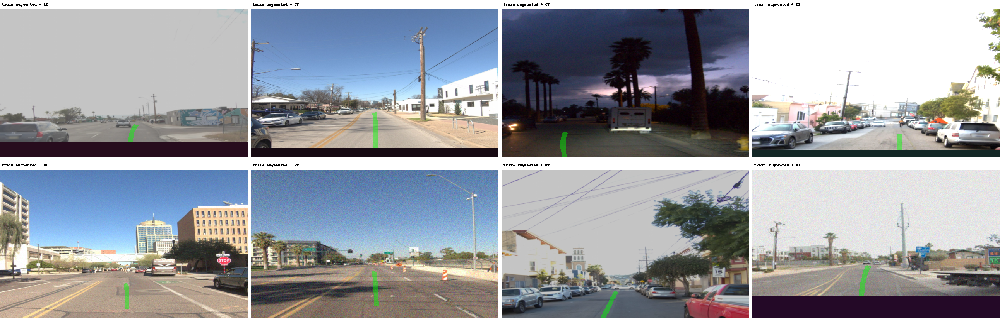

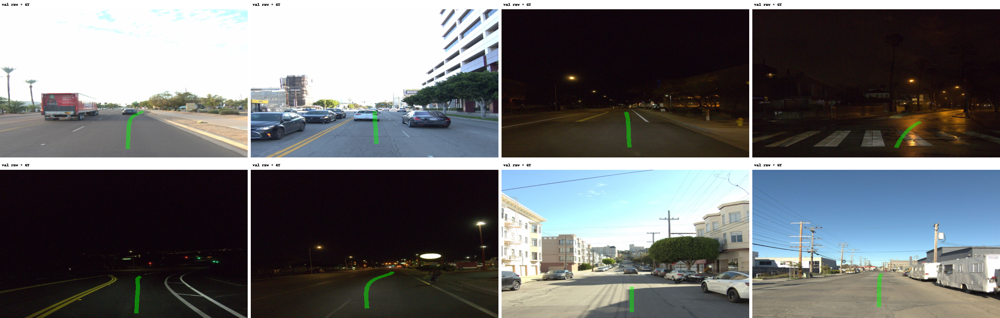

In [19]:
# Show a few augmented train samples and non-augmented val samples using PIL only.
def tensor_rgb_to_uint8(t):
    arr = t.detach().cpu().permute(1, 2, 0).numpy()
    return (arr * 255).clip(0, 255).astype(np.uint8)

def overlay_gt(image_t, mask_t, alpha=0.45):
    rgb = tensor_rgb_to_uint8(image_t)
    mask = mask_t.detach().cpu().numpy()[0] >= 0.5
    out = rgb.astype(np.float32)
    color = np.array([0, 255, 0], dtype=np.float32)
    out[mask] = (1-alpha) * out[mask] + alpha * color
    return Image.fromarray(out.clip(0, 255).astype(np.uint8))

def grid_images(images, labels=None, cols=4, pad=8):
    font = ImageFont.load_default()
    if labels:
        labeled = []
        for img, label in zip(images, labels):
            bar_h = 24
            canvas = Image.new("RGB", (img.width, img.height + bar_h), (255,255,255))
            canvas.paste(img, (0, bar_h))
            ImageDraw.Draw(canvas).text((5, 6), label, fill=(0,0,0), font=font)
            labeled.append(canvas)
        images = labeled
    rows = math.ceil(len(images) / cols)
    w = cols * images[0].width + (cols-1)*pad
    h = rows * images[0].height + (rows-1)*pad
    canvas = Image.new("RGB", (w, h), (255,255,255))
    for i, img in enumerate(images):
        x = (i % cols) * (img.width + pad)
        y = (i // cols) * (img.height + pad)
        canvas.paste(img, (x, y))
    return canvas

imgs = []
labels = []
for i in range(8):
    s = train_ds[random.randint(0, len(train_ds)-1)]
    imgs.append(overlay_gt(s["image"], s["mask"]))
    labels.append("train augmented + GT")

display(grid_images(imgs, labels, cols=4))

imgs = []
labels = []
for i in range(8):
    s = val_ds[random.randint(0, len(val_ds)-1)]
    imgs.append(overlay_gt(s["image"], s["mask"]))
    labels.append("val raw + GT")

display(grid_images(imgs, labels, cols=4))


## Model

Более сильная модель без intent:

`ResNet50 encoder + U-Net-style decoder + ConvBlock segmentation head`

Вход:

`image: [B, 3, 384, 640]`

Выход:

`logits: [B, 1, 384, 640]`


In [20]:
# -------------------------
# Model: ResNet50 U-Net-style segmentation model, no intent
# -------------------------
try:
    from torchvision.models import resnet50, ResNet50_Weights
except Exception as e:
    raise RuntimeError(f"torchvision import failed: {e}")

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=0.0):
        super().__init__()
        layers = [
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        if dropout > 0:
            layers.append(nn.Dropout2d(dropout))
        layers += [
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

class UpBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, dropout=0.0):
        super().__init__()
        self.conv = ConvBlock(in_ch + skip_ch, out_ch, dropout=dropout)

    def forward(self, x, skip):
        x = F.interpolate(x, size=skip.shape[-2:], mode="bilinear", align_corners=False)
        x = torch.cat([x, skip], dim=1)
        return self.conv(x)

class ResNet50UNet(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        weights = ResNet50_Weights.DEFAULT if pretrained else None
        encoder = resnet50(weights=weights)

        self.stem = nn.Sequential(encoder.conv1, encoder.bn1, encoder.relu)  # /2, 64
        self.pool = encoder.maxpool  # /4
        self.enc1 = encoder.layer1   # /4, 256
        self.enc2 = encoder.layer2   # /8, 512
        self.enc3 = encoder.layer3   # /16, 1024
        self.enc4 = encoder.layer4   # /32, 2048

        self.center = ConvBlock(2048, 1024, dropout=0.10)

        self.up4 = UpBlock(1024, 1024, 512, dropout=0.05)
        self.up3 = UpBlock(512, 512, 256, dropout=0.05)
        self.up2 = UpBlock(256, 256, 128, dropout=0.03)
        self.up1 = UpBlock(128, 64, 64, dropout=0.00)

        self.final = nn.Sequential(
            ConvBlock(64, 32, dropout=0.0),
            nn.Conv2d(32, 1, kernel_size=1),
        )

    def forward(self, x):
        input_size = x.shape[-2:]

        s0 = self.stem(x)       # B, 64, H/2, W/2
        x = self.pool(s0)       # B, 64, H/4, W/4

        s1 = self.enc1(x)       # B, 256, H/4, W/4
        s2 = self.enc2(s1)      # B, 512, H/8, W/8
        s3 = self.enc3(s2)      # B, 1024, H/16, W/16
        s4 = self.enc4(s3)      # B, 2048, H/32, W/32

        x = self.center(s4)
        x = self.up4(x, s3)
        x = self.up3(x, s2)
        x = self.up2(x, s1)
        x = self.up1(x, s0)

        logits = self.final(x)
        if logits.shape[-2:] != input_size:
            logits = F.interpolate(logits, size=input_size, mode="bilinear", align_corners=False)
        return logits

model = ResNet50UNet(pretrained=PRETRAINED_ENCODER).to(DEVICE)

def count_params(module, trainable_only=False):
    if trainable_only:
        return sum(p.numel() for p in module.parameters() if p.requires_grad)
    return sum(p.numel() for p in module.parameters())

def fmt_params(n):
    if n >= 1_000_000:
        return f"{n/1_000_000:.3f}M"
    if n >= 1_000:
        return f"{n/1_000:.1f}K"
    return str(n)

total_params = count_params(model)
trainable_params = count_params(model, trainable_only=True)
print("total params:", total_params, fmt_params(total_params))
print("trainable params:", trainable_params, fmt_params(trainable_params))

# shape smoke test
x = torch.zeros(2, 3, IMAGE_SIZE[0], IMAGE_SIZE[1], device=DEVICE)
with torch.no_grad():
    y = model(x)
print("input :", tuple(x.shape))
print("output:", tuple(y.shape))
assert y.shape == (2, 1, IMAGE_SIZE[0], IMAGE_SIZE[1])


total params: 67485665 67.486M
trainable params: 67485665 67.486M
input : (2, 3, 384, 640)
output: (2, 1, 384, 640)


In [21]:
# -------------------------
# Loss and metrics
# -------------------------
def dice_loss_from_logits(logits, targets, eps=1e-7):
    probs = torch.sigmoid(logits)
    targets = targets.float()
    dims = (1, 2, 3)
    intersection = (probs * targets).sum(dim=dims)
    denom = probs.sum(dim=dims) + targets.sum(dim=dims)
    dice = (2.0 * intersection + eps) / (denom + eps)
    return 1.0 - dice.mean()

class BCEDiceLoss(nn.Module):
    def __init__(self, bce_weight=1.0, dice_weight=1.0):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

    def forward(self, logits, targets):
        bce = self.bce(logits, targets)
        dice = dice_loss_from_logits(logits, targets)
        total = self.bce_weight * bce + self.dice_weight * dice
        return total, {"bce": float(bce.detach().cpu()), "dice_loss": float(dice.detach().cpu())}

@torch.no_grad()
def segmentation_metrics_from_logits(logits, targets, threshold=0.5, eps=1e-7):
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()
    targets = (targets >= 0.5).float()

    dims = (1, 2, 3)
    tp = (preds * targets).sum(dim=dims)
    fp = (preds * (1 - targets)).sum(dim=dims)
    fn = ((1 - preds) * targets).sum(dim=dims)

    dice = (2 * tp + eps) / (2 * tp + fp + fn + eps)
    iou = (tp + eps) / (tp + fp + fn + eps)

    return {
        "dice": float(dice.mean().detach().cpu()),
        "iou": float(iou.mean().detach().cpu()),
    }

criterion = BCEDiceLoss(BCE_WEIGHT, DICE_WEIGHT)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=LR * 0.05)
scaler = amp.GradScaler(enabled=USE_AMP)

def amp_context():
    return amp.autocast(enabled=USE_AMP)


/tmp/ipykernel_2583699/3869758439.py:48: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler(enabled=USE_AMP)


In [22]:
# -------------------------
# Save config
# -------------------------
config = {
    "SEED": SEED,
    "DATASET_ROOT": str(DATASET_ROOT),
    "CAMERA_NAME": CAMERA_NAME,
    "TRAIN_MANIFEST": str(TRAIN_MANIFEST),
    "VAL_MANIFEST": str(VAL_MANIFEST),
    "RUN_DIR": str(RUN_DIR),
    "IMAGE_SIZE": IMAGE_SIZE,
    "BATCH_SIZE": BATCH_SIZE,
    "NUM_EPOCHS": NUM_EPOCHS,
    "LR": LR,
    "WEIGHT_DECAY": WEIGHT_DECAY,
    "NUM_WORKERS": NUM_WORKERS,
    "PIN_MEMORY": PIN_MEMORY,
    "PRETRAINED_ENCODER": PRETRAINED_ENCODER,
    "MODEL": "ResNet50UNet_no_intent_augmented",
    "PROGRESS_BAR": "one tqdm bar per epoch, train+val combined",
    "TOTAL_PARAMS": total_params,
    "TRAINABLE_PARAMS": trainable_params,
    "BCE_WEIGHT": BCE_WEIGHT,
    "DICE_WEIGHT": DICE_WEIGHT,
    "MAIN_THRESHOLD": MAIN_THRESHOLD,
    "VIS_THRESHOLDS": VIS_THRESHOLDS,
    "NUM_TRAIN_ROWS": len(train_rows),
    "NUM_VAL_ROWS": len(val_rows),
    "TRAIN_BATCHES": len(train_loader),
    "VAL_BATCHES": len(val_loader),
    "AUGMENTATIONS": {
        "color_jitter": True,
        "blur": True,
        "noise": True,
        "random_resized_crop": True,
        "small_affine_shift_scale": True,
        "bottom_occlusion_dashboard_hood": True,
        "horizontal_flip": False,
    }
}
write_json(CONFIG_PATH, config)
log("Training config saved")
log(json.dumps(config, ensure_ascii=False))


In [23]:
# -------------------------
# Train / evaluate loops with one tqdm progress bar per epoch
# -------------------------
def move_batch(batch, device):
    images = batch["image"].to(device, non_blocking=True)
    masks = batch["mask"].to(device, non_blocking=True)
    return images, masks

def _avg_running(running, n):
    return {k: v / max(n, 1) for k, v in running.items()}

def train_one_epoch(epoch, pbar=None):
    model.train()
    start = time.time()
    total_batches = len(train_loader)

    running = defaultdict(float)
    n = 0

    for batch_idx, batch in enumerate(train_loader, start=1):
        images, masks = move_batch(batch, DEVICE)

        optimizer.zero_grad(set_to_none=True)
        with amp_context():
            logits = model(images)
            loss, parts = criterion(logits, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        with torch.no_grad():
            m = segmentation_metrics_from_logits(logits, masks, threshold=MAIN_THRESHOLD)

        lv = float(loss.detach().cpu())
        running["loss"] += lv
        running["bce"] += parts["bce"]
        running["dice_loss"] += parts["dice_loss"]
        running["dice"] += m["dice"]
        running["iou"] += m["iou"]
        n += 1

        avg = _avg_running(running, n)
        elapsed = time.time() - start

        if pbar is not None:
            pbar.set_description(f"Epoch {epoch:03d}/{NUM_EPOCHS} | train")
            pbar.set_postfix({
                "tr_loss": f"{avg['loss']:.4f}",
                "tr_dice": f"{avg['dice']:.4f}",
                "tr_iou": f"{avg['iou']:.4f}",
                "lr": f"{optimizer.param_groups[0]['lr']:.2e}",
            }, refresh=False)
            pbar.update(1)

        # Detailed progress still goes to train.log and status.json, not to notebook output.
        if batch_idx == 1 or batch_idx % LOG_EVERY_N_BATCHES == 0 or batch_idx == total_batches:
            log(
                f"Epoch {epoch:03d}/{NUM_EPOCHS} train "
                f"batch {batch_idx:05d}/{total_batches} "
                f"loss={avg['loss']:.6f} bce={avg['bce']:.6f} dice_loss={avg['dice_loss']:.6f} "
                f"dice={avg['dice']:.6f} iou={avg['iou']:.6f} "
                f"lr={optimizer.param_groups[0]['lr']:.8f} elapsed_sec={elapsed:.1f}"
            )
            write_status(
                stage="train",
                epoch=epoch,
                total_epochs=NUM_EPOCHS,
                batch=batch_idx,
                total_batches=total_batches,
                loss=avg["loss"],
                bce=avg["bce"],
                dice_loss=avg["dice_loss"],
                dice=avg["dice"],
                iou=avg["iou"],
                lr=optimizer.param_groups[0]["lr"],
                elapsed_sec=elapsed,
            )

    elapsed = time.time() - start
    avg = _avg_running(running, n)
    avg["time_sec"] = elapsed
    return avg

@torch.no_grad()
def evaluate(epoch, pbar=None):
    model.eval()
    start = time.time()
    total_batches = len(val_loader)

    running = defaultdict(float)
    n = 0

    for batch_idx, batch in enumerate(val_loader, start=1):
        images, masks = move_batch(batch, DEVICE)
        with amp_context():
            logits = model(images)
            loss, parts = criterion(logits, masks)
        m = segmentation_metrics_from_logits(logits, masks, threshold=MAIN_THRESHOLD)

        lv = float(loss.detach().cpu())
        running["loss"] += lv
        running["bce"] += parts["bce"]
        running["dice_loss"] += parts["dice_loss"]
        running["dice"] += m["dice"]
        running["iou"] += m["iou"]
        n += 1

        avg = _avg_running(running, n)
        elapsed = time.time() - start

        if pbar is not None:
            pbar.set_description(f"Epoch {epoch:03d}/{NUM_EPOCHS} | val")
            pbar.set_postfix({
                "val_loss": f"{avg['loss']:.4f}",
                "val_dice": f"{avg['dice']:.4f}",
                "val_iou": f"{avg['iou']:.4f}",
            }, refresh=False)
            pbar.update(1)

        if batch_idx == 1 or batch_idx % LOG_EVERY_N_BATCHES == 0 or batch_idx == total_batches:
            log(
                f"Epoch {epoch:03d}/{NUM_EPOCHS} val "
                f"batch {batch_idx:05d}/{total_batches} "
                f"loss={avg['loss']:.6f} bce={avg['bce']:.6f} dice_loss={avg['dice_loss']:.6f} "
                f"dice={avg['dice']:.6f} iou={avg['iou']:.6f} elapsed_sec={elapsed:.1f}"
            )
            write_status(
                stage="val",
                epoch=epoch,
                total_epochs=NUM_EPOCHS,
                batch=batch_idx,
                total_batches=total_batches,
                loss=avg["loss"],
                bce=avg["bce"],
                dice_loss=avg["dice_loss"],
                dice=avg["dice"],
                iou=avg["iou"],
                elapsed_sec=elapsed,
            )

    elapsed = time.time() - start
    avg = _avg_running(running, n)
    avg["time_sec"] = elapsed
    return avg

def save_checkpoint(path, epoch, best_val_dice, history):
    torch.save({
        "epoch": epoch,
        "model_name": "ResNet50UNet_no_intent_augmented",
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "best_val_dice": best_val_dice,
        "history": history,
        "config": config,
    }, path)


In [24]:
# -------------------------
# Main training loop
# -------------------------
BEST_MODEL_PATH = RUN_DIR / "best_model.pt"
LAST_MODEL_PATH = RUN_DIR / "last_model.pt"

history = []
best_val_dice = -1.0
best_epoch = None

log(f"Training started for {NUM_EPOCHS} epochs")
write_status(stage="training_started", epoch=0, total_epochs=NUM_EPOCHS)

for epoch in range(1, NUM_EPOCHS + 1):
    epoch_start = time.time()
    log(f"Epoch {epoch:03d}/{NUM_EPOCHS} START")

    epoch_total_batches = len(train_loader) + len(val_loader)
    with tqdm(
        total=epoch_total_batches,
        desc=f"Epoch {epoch:03d}/{NUM_EPOCHS} | train",
        dynamic_ncols=True,
        leave=True,
        colour="#2f6fed",
        smoothing=0.05,
    ) as pbar:
        train_metrics = train_one_epoch(epoch, pbar=pbar)
        pbar.set_postfix({
            "train_loss": f"{train_metrics['loss']:.4f}",
            "train_dice": f"{train_metrics['dice']:.4f}",
            "stage": "val_start",
        })

        log(
            f"Epoch {epoch:03d}/{NUM_EPOCHS} TRAIN DONE | "
            f"loss={train_metrics['loss']:.6f} bce={train_metrics['bce']:.6f} "
            f"dice_loss={train_metrics['dice_loss']:.6f} dice={train_metrics['dice']:.6f} "
            f"iou={train_metrics['iou']:.6f} time_sec={train_metrics['time_sec']:.1f}"
        )

        val_metrics = evaluate(epoch, pbar=pbar)
        pbar.set_description(f"Epoch {epoch:03d}/{NUM_EPOCHS} | done")
        pbar.set_postfix({
            "tr_loss": f"{train_metrics['loss']:.4f}",
            "val_loss": f"{val_metrics['loss']:.4f}",
            "val_dice": f"{val_metrics['dice']:.4f}",
            "best": f"{max(best_val_dice, val_metrics['dice']):.4f}",
        })

    log(
        f"Epoch {epoch:03d}/{NUM_EPOCHS} VAL DONE | "
        f"loss={val_metrics['loss']:.6f} bce={val_metrics['bce']:.6f} "
        f"dice_loss={val_metrics['dice_loss']:.6f} dice={val_metrics['dice']:.6f} "
        f"iou={val_metrics['iou']:.6f} time_sec={val_metrics['time_sec']:.1f}"
    )

    scheduler.step()

    row = {
        "epoch": epoch,
        "lr": optimizer.param_groups[0]["lr"],
        "train_loss": train_metrics["loss"],
        "train_bce": train_metrics["bce"],
        "train_dice_loss": train_metrics["dice_loss"],
        "train_dice": train_metrics["dice"],
        "train_iou": train_metrics["iou"],
        "train_time_sec": train_metrics["time_sec"],
        "val_loss": val_metrics["loss"],
        "val_bce": val_metrics["bce"],
        "val_dice_loss": val_metrics["dice_loss"],
        "val_dice": val_metrics["dice"],
        "val_iou": val_metrics["iou"],
        "val_time_sec": val_metrics["time_sec"],
        "epoch_time_sec": time.time() - epoch_start,
    }
    history.append(row)

    write_json(HISTORY_PATH, history)
    pd.DataFrame(history).to_csv(HISTORY_CSV_PATH, index=False)

    save_checkpoint(LAST_MODEL_PATH, epoch, best_val_dice, history)

    if val_metrics["dice"] > best_val_dice:
        best_val_dice = val_metrics["dice"]
        best_epoch = epoch
        save_checkpoint(BEST_MODEL_PATH, epoch, best_val_dice, history)
        log(f"New best model saved | epoch={epoch} best_val_dice={best_val_dice:.6f} path={BEST_MODEL_PATH}")

    write_status(
        stage="epoch_finished",
        epoch=epoch,
        total_epochs=NUM_EPOCHS,
        best_epoch=best_epoch,
        best_val_dice=best_val_dice,
        last_train_loss=train_metrics["loss"],
        last_train_dice=train_metrics["dice"],
        last_val_loss=val_metrics["loss"],
        last_val_dice=val_metrics["dice"],
        history_path=str(HISTORY_PATH),
        history_csv_path=str(HISTORY_CSV_PATH),
        best_checkpoint=str(BEST_MODEL_PATH),
        last_checkpoint=str(LAST_MODEL_PATH),
    )

    print(
        f"Epoch {epoch:03d}/{NUM_EPOCHS} summary | "
        f"train_loss={train_metrics['loss']:.4f} train_dice={train_metrics['dice']:.4f} | "
        f"val_loss={val_metrics['loss']:.4f} val_dice={val_metrics['dice']:.4f} | "
        f"best_val_dice={best_val_dice:.4f}"
    )

log(f"Training finished | best_epoch={best_epoch} best_val_dice={best_val_dice:.6f}")
write_status(
    stage="training_finished",
    epoch=NUM_EPOCHS,
    total_epochs=NUM_EPOCHS,
    best_epoch=best_epoch,
    best_val_dice=best_val_dice,
    best_checkpoint=str(BEST_MODEL_PATH),
    last_checkpoint=str(LAST_MODEL_PATH),
    history_path=str(HISTORY_PATH),
    history_csv_path=str(HISTORY_CSV_PATH),
    config_path=str(CONFIG_PATH),
    log_path=str(LOG_PATH),
)

Epoch 001/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 001/20 | done: 100%|██████████| 11555/11555 [53:15<00:00,  3.62it/s, tr_loss=0.6821, val_loss=0.6487, val_dice=0.3869, best=0.3869]


Epoch 001/20 summary | train_loss=0.6821 train_dice=0.4102 | val_loss=0.6487 val_dice=0.3869 | best_val_dice=0.3869


Epoch 002/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 002/20 | done: 100%|██████████| 11555/11555 [53:20<00:00,  3.61it/s, tr_loss=0.5184, val_loss=0.6585, val_dice=0.3758, best=0.3869]


Epoch 002/20 summary | train_loss=0.5184 train_dice=0.5115 | val_loss=0.6585 val_dice=0.3758 | best_val_dice=0.3869


Epoch 003/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 003/20 | train:  33%|███▎      | 3769/11555 [19:38<40:33,  3.20it/s, tr_loss=0.4773, tr_dice=0.5507, tr_iou=0.4328, lr=1.95e-04]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Epoch 003/20 | done: 100%|██████████| 11555/11555 [53:39<00:00,  3.59it/s, tr_loss=0.4664, val_loss=0.6801, val_dice=0.3554, best=0.3869]


Epoch 003/20 summary | train_loss=0.4664 train_dice=0.5611 | val_loss=0.6801 val_dice=0.3554 | best_val_dice=0.3869


Epoch 004/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 004/20 | train:  62%|██████▏   | 7112/11555 [36:57<23:05,  3.21it/s, tr_loss=0.4308, tr_dice=0.5950, tr_iou=0.4775, lr=1.90e-04]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Epoch 006/20 | done: 100%|██████████| 11555/11555 [53:36<00:00,  3.59it/s, tr_loss=0.3705, val_loss=0.7031, val_dice=0.3355, best=0.3869]


Epoch 006/20 summary | train_loss=0.3705 train_dice=0.6528 | val_loss=0.7031 val_dice=0.3355 | best_val_dice=0.3869


Epoch 007/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 007/20 | done: 100%|██████████| 11555/11555 [53:38<00:00,  3.59it/s, tr_loss=0.3479, val_loss=0.7174, val_dice=0.3207, best=0.3869]


Epoch 007/20 summary | train_loss=0.3479 train_dice=0.6749 | val_loss=0.7174 val_dice=0.3207 | best_val_dice=0.3869


Epoch 008/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 008/20 | done: 100%|██████████| 11555/11555 [53:51<00:00,  3.58it/s, tr_loss=0.3281, val_loss=nan, val_dice=0.3188, best=0.3869]


Epoch 008/20 summary | train_loss=0.3281 train_dice=0.6935 | val_loss=nan val_dice=0.3188 | best_val_dice=0.3869


Epoch 009/20 | train:   0%|          | 0/11555 [00:00<?, ?it/s]/tmp/ipykernel_2583699/3869758439.py:51: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return amp.autocast(enabled=USE_AMP)
Epoch 010/20 | train:  79%|███████▊  | 9081/11555 [47:42<12:51,  3.21it/s, tr_loss=0.2939, tr_dice=0.7270, tr_iou=0.6206, lr=1.20e-04]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Epoch 013/20 | train:  36%|███▌      | 4104/11555 [21:31<38:53,  3.19it/s, tr_loss=0.2556, tr_dice=0.7633, tr_iou=0.6640, lr=7.56e-05]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this lim

## Threshold metrics on validation

После обучения считаем Dice/IoU на `VAL` при нескольких порогах.


In [25]:
# -------------------------
# Threshold metrics on validation using best checkpoint
# -------------------------
def load_best_model():
    ckpt = torch.load(BEST_MODEL_PATH, map_location=DEVICE)
    model.load_state_dict(ckpt["model_state_dict"], strict=True)
    model.to(DEVICE)
    model.eval()
    return ckpt

ckpt = load_best_model()
print("loaded best epoch:", ckpt.get("epoch"), "best_val_dice:", ckpt.get("best_val_dice"))

@torch.no_grad()
def threshold_metrics(loader, thresholds):
    stats = {str(t): defaultdict(float) for t in thresholds}
    for batch_idx, batch in enumerate(loader, start=1):
        images, masks = move_batch(batch, DEVICE)
        logits = model(images)
        probs = torch.sigmoid(logits)
        target = (masks >= 0.5).float()
        dims = (1, 2, 3)
        for t in thresholds:
            pred = (probs >= t).float()
            tp = (pred * target).sum(dim=dims)
            fp = (pred * (1 - target)).sum(dim=dims)
            fn = ((1 - pred) * target).sum(dim=dims)
            dice = (2 * tp + 1e-7) / (2 * tp + fp + fn + 1e-7)
            iou = (tp + 1e-7) / (tp + fp + fn + 1e-7)
            s = stats[str(t)]
            s["dice_sum"] += dice.sum().item()
            s["iou_sum"] += iou.sum().item()
            s["n"] += target.shape[0]
            s["tp"] += tp.sum().item()
            s["fp"] += fp.sum().item()
            s["fn"] += fn.sum().item()
        if batch_idx == 1 or batch_idx % 100 == 0 or batch_idx == len(loader):
            print(f"threshold metrics batch {batch_idx}/{len(loader)}")
    out = {}
    for t, s in stats.items():
        n = max(int(s["n"]), 1)
        out[t] = {
            "dice": s["dice_sum"] / n,
            "iou": s["iou_sum"] / n,
            "n_images": int(s["n"]),
            "tp": s["tp"],
            "fp": s["fp"],
            "fn": s["fn"],
        }
    return out

metrics = threshold_metrics(val_loader, VIS_THRESHOLDS)
THRESHOLD_METRICS_PATH = RUN_DIR / "threshold_metrics.json"
write_json(THRESHOLD_METRICS_PATH, metrics)
print(json.dumps(metrics, indent=2))
print("saved:", THRESHOLD_METRICS_PATH)

/tmp/ipykernel_2583699/3792853186.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(BEST_MODEL_PATH, map_location=DEVICE)


loaded best epoch: 1 best_val_dice: 0.38694377066263186
threshold metrics batch 1/2295
threshold metrics batch 100/2295
threshold metrics batch 200/2295
threshold metrics batch 300/2295
threshold metrics batch 400/2295
threshold metrics batch 500/2295
threshold metrics batch 600/2295
threshold metrics batch 700/2295
threshold metrics batch 800/2295
threshold metrics batch 900/2295
threshold metrics batch 1000/2295
threshold metrics batch 1100/2295
threshold metrics batch 1200/2295
threshold metrics batch 1300/2295
threshold metrics batch 1400/2295
threshold metrics batch 1500/2295
threshold metrics batch 1600/2295
threshold metrics batch 1700/2295
threshold metrics batch 1800/2295
threshold metrics batch 1900/2295
threshold metrics batch 2000/2295
threshold metrics batch 2100/2295
threshold metrics batch 2200/2295
threshold metrics batch 2295/2295
{
  "0.3": {
    "dice": 0.38834606235670754,
    "iou": 0.2818138306360619,
    "n_images": 73429,
    "tp": 36484669.0,
    "fp": 92426749

## Save validation examples

Сохраняет примеры с лучшей моделью: input, GT, probability, pred/overlay для 3 thresholds.


saved 40 examples to: /home/Jupyter/datasets/tesla/Waymo_open_dataset/runs/corridor_resnet50_augmented_no_intent_v2/val_examples_best_model


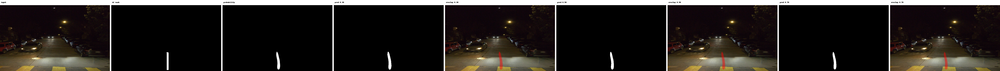

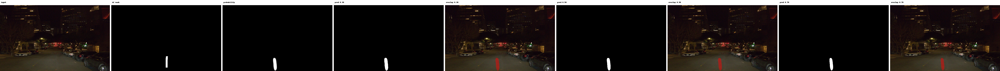

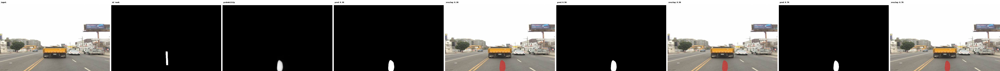

In [26]:
# -------------------------
# Save validation visual examples through PIL
# -------------------------
VIS_DIR = RUN_DIR / "val_examples_best_model"
VIS_DIR.mkdir(parents=True, exist_ok=True)

def mask_to_uint8(mask_hw):
    arr = mask_hw.detach().cpu().numpy() if torch.is_tensor(mask_hw) else mask_hw
    return (arr * 255).clip(0, 255).astype(np.uint8)

def prob_to_uint8(prob_hw):
    arr = prob_hw.detach().cpu().numpy() if torch.is_tensor(prob_hw) else prob_hw
    return (arr * 255).clip(0, 255).astype(np.uint8)

def overlay_mask_on_rgb(rgb, mask_bool, color=(255,0,0), alpha=0.45):
    out = rgb.copy().astype(np.float32)
    c = np.array(color, dtype=np.float32)
    out[mask_bool] = (1 - alpha) * out[mask_bool] + alpha * c
    return out.clip(0, 255).astype(np.uint8)

def add_label(img, label, bar_h=30):
    img = img.convert("RGB")
    out = Image.new("RGB", (img.width, img.height + bar_h), (255,255,255))
    out.paste(img, (0, bar_h))
    ImageDraw.Draw(out).text((6, 8), label, fill=(0,0,0))
    return out

def hstack(images, labels=None, pad=8):
    if labels is not None:
        images = [add_label(img, label) for img, label in zip(images, labels)]
    w = sum(i.width for i in images) + pad * (len(images)-1)
    h = max(i.height for i in images)
    canvas = Image.new("RGB", (w, h), (255,255,255))
    x = 0
    for img in images:
        canvas.paste(img.convert("RGB"), (x, 0))
        x += img.width + pad
    return canvas

model.eval()
rng = random.Random(SEED + 999)
indices = rng.sample(range(len(val_ds)), min(NUM_VIS_EXAMPLES, len(val_ds)))
saved = []

for out_i, idx in enumerate(indices):
    sample = val_ds[idx]
    image_t = sample["image"]
    mask_t = sample["mask"][0]
    rgb = tensor_rgb_to_uint8(image_t)

    with torch.no_grad():
        logits = model(image_t.unsqueeze(0).to(DEVICE))
        prob = torch.sigmoid(logits)[0,0].detach().cpu()

    panels = [
        Image.fromarray(rgb),
        Image.fromarray(mask_to_uint8(mask_t)).convert("RGB"),
        Image.fromarray(prob_to_uint8(prob)).convert("RGB"),
    ]
    labels = ["input", "GT mask", "probability"]

    prob_np = prob.numpy()
    for t in VIS_THRESHOLDS:
        pred = prob_np >= t
        pred_u8 = (pred.astype(np.uint8) * 255)
        overlay = overlay_mask_on_rgb(rgb, pred, color=(255,0,0), alpha=0.45)
        panels += [Image.fromarray(pred_u8).convert("RGB"), Image.fromarray(overlay)]
        labels += [f"pred {t:.2f}", f"overlay {t:.2f}"]

    canvas = hstack(panels, labels=labels)
    out_path = VIS_DIR / f"val_example_{out_i:03d}_idx_{idx}.png"
    canvas.save(out_path)
    saved.append(out_path)

print(f"saved {len(saved)} examples to: {VIS_DIR}")
for p in saved[:3]:
    display(Image.open(p))


## Save training plots as HTML

Графики сохраняются без matplotlib: через Plotly. Если Plotly не установлен, notebook сохранит CSV/JSON, а графики можно построить потом.


    epoch        lr  train_loss  train_bce  train_dice_loss  train_dice  \
0       1  0.000199    0.682069   0.047344         0.634725    0.410162   
1       2  0.000195    0.518367   0.023726         0.494641    0.511473   
2       3  0.000190    0.466390   0.021735         0.444655    0.561121   
3       4  0.000182    0.427886   0.020232         0.407655    0.597781   
4       5  0.000172    0.397161   0.019010         0.378152    0.627390   
5       6  0.000161    0.370540   0.017917         0.352624    0.652751   
6       7  0.000148    0.347903   0.017005         0.330898    0.674936   
7       8  0.000134    0.328080   0.016183         0.311896    0.693521   
8       9  0.000120    0.310050   0.015451         0.294599    0.711204   
9      10  0.000105    0.293912   0.014768         0.279144    0.726974   
10     11  0.000090    0.279787   0.014141         0.265646    0.740725   
11     12  0.000076    0.266619   0.013595         0.253024    0.753148   
12     13  0.000062    0.

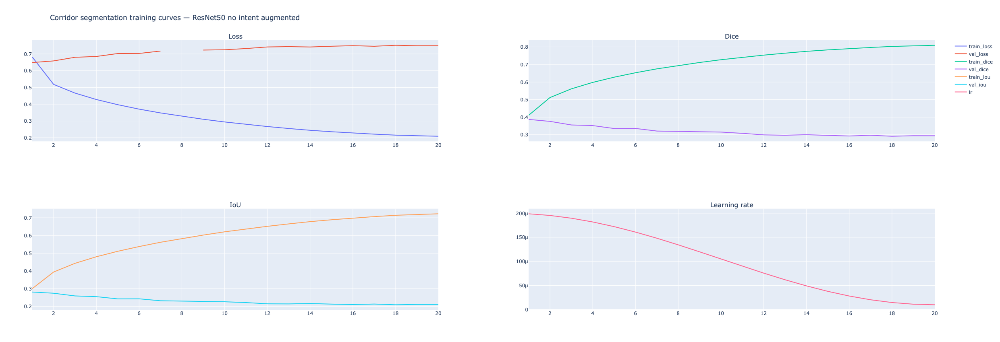

saved: /home/Jupyter/datasets/tesla/Waymo_open_dataset/runs/corridor_resnet50_augmented_no_intent_v2/training_plots/training_curves.html
{
  "best_epoch_by_val_dice": 1,
  "best_val_dice": 0.386943770662631,
  "best_val_iou_at_best_dice": 0.281456701441268,
  "min_val_loss_epoch": 1,
  "min_val_loss": 0.6487224295118531
}


In [27]:
# -------------------------
# Plotly training curves
# -------------------------
PLOTS_DIR = RUN_DIR / "training_plots"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

hist_df = pd.read_json(HISTORY_PATH)
hist_df.to_csv(PLOTS_DIR / "history_table.csv", index=False)
print(hist_df)

try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=("Loss", "Dice", "IoU", "Learning rate"),
    )
    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["train_loss"], name="train_loss"), row=1, col=1)
    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["val_loss"], name="val_loss"), row=1, col=1)

    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["train_dice"], name="train_dice"), row=1, col=2)
    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["val_dice"], name="val_dice"), row=1, col=2)

    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["train_iou"], name="train_iou"), row=2, col=1)
    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["val_iou"], name="val_iou"), row=2, col=1)

    fig.add_trace(go.Scatter(x=hist_df["epoch"], y=hist_df["lr"], name="lr"), row=2, col=2)

    fig.update_layout(
        title="Corridor segmentation training curves — ResNet50 no intent augmented",
        height=850,
        width=1200,
        hovermode="x unified",
    )

    out_html = PLOTS_DIR / "training_curves.html"
    fig.write_html(str(out_html))
    display(fig)
    print("saved:", out_html)
except Exception as e:
    print("Plotly failed:", repr(e))

summary = {
    "best_epoch_by_val_dice": int(hist_df.loc[hist_df["val_dice"].idxmax(), "epoch"]),
    "best_val_dice": float(hist_df["val_dice"].max()),
    "best_val_iou_at_best_dice": float(hist_df.loc[hist_df["val_dice"].idxmax(), "val_iou"]),
    "min_val_loss_epoch": int(hist_df.loc[hist_df["val_loss"].idxmin(), "epoch"]),
    "min_val_loss": float(hist_df["val_loss"].min()),
}
write_json(PLOTS_DIR / "training_summary.json", summary)
print(json.dumps(summary, indent=2))


## Output files

После успешного запуска ключевые файлы будут здесь:

```text
runs/corridor_resnet50_augmented_no_intent_v2/
├── best_model.pt
├── last_model.pt
├── history.json
├── history.csv
├── config.json
├── threshold_metrics.json
├── train.log
├── status.json
├── val_examples_best_model/
└── training_plots/
    ├── history_table.csv
    ├── training_curves.html
    └── training_summary.json
```
